In [1]:
import ReservoirComputer_3 as ReCom
import numpy as np
import scipy.sparse as sp
import ReservoirPlot as resplt
import ReservoirAnalysis as resan
import matplotlib.pyplot as plt
import scipy.integrate as integrate
import ipywidgets as widgets

In [2]:
def lorenz(u, *args):
    x, y, z = u[0], u[1], u[2]
    beta, rho, sigma = alpha[0], alpha[1], alpha[2]
    
    return np.asarray([sigma*(y - x), x*(rho - z) - y, x*y - beta*z])


def RK4_step(x, dt, f, args):
    k_1 = f(x, args)
    k_2 = f(x + dt*k_1/2, args)
    k_3 = f(x + dt*k_2/2, args)
    k_4 = f(x + dt*k_3, args)
    return 1/6*dt*(k_1 + 2*k_2 + 2*k_3 + k_4)


def tpe(u_hat, dt, f, args):
    # Calculate approx. and ideal movement vectors.
    delta_hat = np.diff(u_hat, axis=0)
    delta = np.asarray([RK4_step(u_hat[i], dt, f, args) for i in range(u_hat.shape[0] - 1)])
    
    # Calculate norms of ideal movement vectors approx. movement vector error.
    delta_norm = np.linalg.norm(delta, axis=1)
    error_norm = np.linalg.norm(delta_hat - delta, axis=1)
    
    # Return TPE.
    return 1/(dt*u_hat.shape[0])*np.sum(np.multiply(error_norm, 1/delta_norm))


def rp(u_hat_array, dt, f, args, tol=10):
    n = u_hat_array.shape[0]
    tpe_array = [tpe(u_hat_array[i], dt, f, args) for i in range(n)]
    return (sum([1 for i in tpe_array if i <= 10])/n, tpe_array)


def evolve(RC, ics, t_points):
    ics = ics.copy()
    ics.append(RC.r_T)
    traj = np.zeros((len(ics), len(t_points), RC.d))
    
    for i in range(len(ics)):
        r0 = ics[i]
        PR_traj = integrate.odeint(RC.f_PR, r0, t_points)
        prediction = np.asarray([RC.W_out.dot(RC.q(p)) for p in PR_traj])
        traj[i,:,:] = prediction
    
    return traj 


def plot_traj(ax, traj, t_start=0, t_end=40000, xlim=300, ylim=300, zlim=300):
    t_start = int(t_start)
    t_end = int(t_end)
    for i in range(len(traj)):
        u = traj[i]
        ax.plot(u[t_start:t_end, 0], u[t_start:t_end, 1], u[t_start:t_end, 2], 'r-',
                markersize=2.0, alpha=1.0,)
        
    for i in range(len(traj)):
        u = traj[i]
        ax.plot(u[t_end-1, 0], u[t_end-1, 1], u[t_end-1, 2], "ko",
                    markersize=3.0, alpha=1.0)
    
    ax.set_xlim3d(-xlim, xlim)
    ax.set_ylim3d(-ylim, ylim)
    ax.set_zlim3d(0,zlim)
    return ax
    

In [16]:
class RhoSigmaGrid(object):
    def __init__(self, rho_list, sigma_list, RC):
        self.rho_list = rho_list
        self.sigma_list = sigma_list
        self.RC = RC
        
        rho, sigma = np.meshgrid(rho_list, sigma_list)
        self.param_space = np.array([rho.flatten(),sigma.flatten()]).T
        self.rho_sigma_RCs = dict(keys=self.param_space)
        
    
    def train_RCs(self, data, time_points, t_listen):
        for rho, sigma in self.param_space:
            self.RC.rho = rho
            self.RC.sigma = sigma
            self.RC.train(data, time_points, t_listen)
            self.rho_sigma_RCs[(rho, sigma)] = {'W_out':self.RC.W_out.copy(), 'r_T':self.RC.r_T.copy()}
        return self.rho_sigma_RCs
        
        
    def TPE_mat(self, time_points, dt, f, args):    
        TPE_matrix = np.zeros((rho_list.size, sigma_list.size))
        for i in range(self.rho_list.size):
            for j in range(self.sigma_list.size):
                rho, sigma = rho_list[i], sigma_list[j]
                self.RC.rho = rho
                self.RC.sigma = sigma
                self.RC.r_T = self.rho_sigma_RCs[(rho, sigma)]['r_T']
                self.RC.W_out = self.rho_sigma_RCs[(rho, sigma)]['W_out']
                x = self.RC.predict(time_points)
                TPE_matrix[i, j] = tpe(x, dt, f, args)
        return TPE_matrix
        
    

In [17]:
T_train = 100
T_predict = 150
dt = 0.01
alpha = (8.0/3.0, 28.0, 10.0)
x0 = np.asarray([1.0, 1.0, 1.0])
t_points_training = np.linspace(0, T_train, int(T_train/dt))
t_points_prediction = np.linspace(0, T_predict, int(T_predict/dt))
train_data = integrate.odeint(lorenz, x0, t_points_training, args=alpha)
val_data = integrate.odeint(lorenz, train_data[-1], t_points_prediction, args=alpha)

In [18]:
RC = ReCom.ESN(N=100, p=0.01, d=3, rho=0.9, sigma=0.014, gamma=10.0, beta=1e-6)

In [19]:
rho_list = np.arange(0, 1.0, 0.01)
sigma_list = np.arange(0, 1.0, 0.01)

rs_grid = RhoSigmaGrid(rho_list, sigma_list, RC)

In [22]:
%%time
rs_grid.train_RCs(train_data, t_points_training, t_listen=5000)

Wall time: 3h 40min 24s


{'keys': array([[0.  , 0.  ],
        [0.01, 0.  ],
        [0.02, 0.  ],
        ...,
        [0.97, 0.99],
        [0.98, 0.99],
        [0.99, 0.99]]),
 (0.0,
  0.0): {'W_out': array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        

In [25]:
rho_sigma_RCs = rs_grid.rho_sigma_RCs

In [26]:
%store rho_sigma_RCs

Stored 'rho_sigma_RCs' (dict)


In [27]:
%%time
TPE_matrix = rs_grid.TPE_mat(t_points_prediction, dt, lorenz, alpha)

<ipython-input-2-eccd5e4dea60>:26: RuntimeWarning: divide by zero encountered in true_divide
  return 1/(dt*u_hat.shape[0])*np.sum(np.multiply(error_norm, 1/delta_norm))
<ipython-input-2-eccd5e4dea60>:26: RuntimeWarning: invalid value encountered in multiply
  return 1/(dt*u_hat.shape[0])*np.sum(np.multiply(error_norm, 1/delta_norm))


Wall time: 6h 18min 37s


In [28]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import cm

In [29]:
log_TPE = np.log10(TPE_matrix[:,1:])

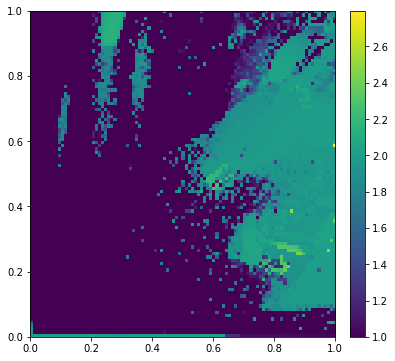

In [31]:
# Fixing random state for reproducibility
np.random.seed(19680801)

fig, ax = plt.subplots(figsize=(6,6))
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size = '5%', pad = 0.2)
#cax = fig.add_axes([.97, .125, .03, .755])
im = ax.imshow(log_TPE,
               origin='lower', extent=[0, 1.0, 0, 1.0], 
                vmax=log_TPE.max(), vmin=1, aspect='auto')

cbar = fig.colorbar(im, cax)